# Session duration data - descriptive statistics, value distribution, measure of central tendency

### Loading data and formatting dtypes

In [39]:
import pandas as pd

In [40]:
path = 'sessions_data_sql_results.csv'

# Custom parser function for session_start and session_end columns
def custom_parser_func(x):
    try:
        return pd.to_datetime(x, format='%Y-%m-%d %H:%M:%S.%f UTC')
    except ValueError:
        # If microseconds are not present, try parsing without microseconds
        return pd.to_datetime(x, format='%Y-%m-%d %H:%M:%S UTC')
    
# Read CSV with parsing dates
df = pd.read_csv(path, parse_dates=['session_start', 'session_end'],
                 date_parser=custom_parser_func)

C:\Users\patry\AppData\Local\Temp\ipykernel_16636\2156779092.py:12: FutureWarning:

The argument 'date_parser' is deprecated and will be removed in a future version. Please use 'date_format' instead, or read your data in as 'object' dtype and then call 'to_datetime'.



In [41]:
df.head()

,session_id,session_start,session_end,session_duration,session_date,weekday,campaign_name,campaign,category,country,user_pseudo_id,purchase_flag,purchase_revenue,bounce_5_flag,bounce_60_flag,user_engagement_segment
0,10001363.4360935308_desktop_0,2020-12-12 04:11:17.508078,2020-12-12 04:11:32.809866,15,2020-12-12 00:00:00 UTC,Saturday,(organic),no_campaign,desktop,Sweden,1.000136e+07,0,NaN,0,1,up_to_1_MIN
1,1000223163.8035209215_mobile_0,2021-01-07 18:35:34.089387,2021-01-07 18:35:44.561794,10,2021-01-07 00:00:00 UTC,Thursday,(direct),no_campaign,mobile,Australia,1.000223e+09,0,NaN,0,1,up_to_1_MIN
2,1000299.7413851356_desktop_0,2021-01-20 11:04:59.887247,2021-01-20 11:05:05.779925,5,2021-01-20 00:00:00 UTC,Wednesday,(direct),no_campaign,desktop,India,1.000300e+06,0,NaN,1,1,up_to_5_SEC
3,1000300.3223254235_desktop_0,2020-11-04 09:21:11.657014,2020-11-04 09:21:18.760672,7,2020-11-04 00:00:00 UTC,Wednesday,<Other>,no_campaign,desktop,France,1.000300e+06,0,NaN,0,1,up_to_1_MIN
4,1000300.3223254235_desktop_1,2020-11-04 13:43:30.570448,2020-11-04 13:43:30.570448,0,2020-11-04 00:00:00 UTC,Wednesday,(referral),no_campaign,desktop,France,1.000300e+06,0,NaN,1,1,up_to_5_SEC


In [42]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 355597 entries, 0 to 355596
Data columns (total 16 columns):
 #   Column                   Non-Null Count   Dtype         
---  ------                   --------------   -----         
 0   session_id               355597 non-null  object        
 1   session_start            355597 non-null  datetime64[ns]
 2   session_end              355597 non-null  datetime64[ns]
 3   session_duration         355597 non-null  int64         
 4   session_date             355597 non-null  object        
 5   weekday                  355597 non-null  object        
 6   campaign_name            262076 non-null  object        
 7   campaign                 355597 non-null  object        
 8   category                 355597 non-null  object        
 9   country                  355597 non-null  object        
 10  user_pseudo_id           355597 non-null  float64       
 11  purchase_flag            355597 non-null  int64         
 12  purchase_revenue

In [43]:
# formatting session_date into YYYY-MM-DD format
df['session_date'] = pd.to_datetime(df['session_date'])

#formatting pseudo_user)id into string
df['user_pseudo_id'] =df['user_pseudo_id'].astype(str)

In [44]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 355597 entries, 0 to 355596
Data columns (total 16 columns):
 #   Column                   Non-Null Count   Dtype              
---  ------                   --------------   -----              
 0   session_id               355597 non-null  object             
 1   session_start            355597 non-null  datetime64[ns]     
 2   session_end              355597 non-null  datetime64[ns]     
 3   session_duration         355597 non-null  int64              
 4   session_date             355597 non-null  datetime64[ns, UTC]
 5   weekday                  355597 non-null  object             
 6   campaign_name            262076 non-null  object             
 7   campaign                 355597 non-null  object             
 8   category                 355597 non-null  object             
 9   country                  355597 non-null  object             
 10  user_pseudo_id           355597 non-null  object             
 11  purchase_flag

In [45]:
df.head()

,session_id,session_start,session_end,session_duration,session_date,weekday,campaign_name,campaign,category,country,user_pseudo_id,purchase_flag,purchase_revenue,bounce_5_flag,bounce_60_flag,user_engagement_segment
0,10001363.4360935308_desktop_0,2020-12-12 04:11:17.508078,2020-12-12 04:11:32.809866,15,2020-12-12 00:00:00+00:00,Saturday,(organic),no_campaign,desktop,Sweden,10001363.43609353,0,NaN,0,1,up_to_1_MIN
1,1000223163.8035209215_mobile_0,2021-01-07 18:35:34.089387,2021-01-07 18:35:44.561794,10,2021-01-07 00:00:00+00:00,Thursday,(direct),no_campaign,mobile,Australia,1000223163.8035208,0,NaN,0,1,up_to_1_MIN
2,1000299.7413851356_desktop_0,2021-01-20 11:04:59.887247,2021-01-20 11:05:05.779925,5,2021-01-20 00:00:00+00:00,Wednesday,(direct),no_campaign,desktop,India,1000299.7413851356,0,NaN,1,1,up_to_5_SEC
3,1000300.3223254235_desktop_0,2020-11-04 09:21:11.657014,2020-11-04 09:21:18.760672,7,2020-11-04 00:00:00+00:00,Wednesday,<Other>,no_campaign,desktop,France,1000300.3223254236,0,NaN,0,1,up_to_1_MIN
4,1000300.3223254235_desktop_1,2020-11-04 13:43:30.570448,2020-11-04 13:43:30.570448,0,2020-11-04 00:00:00+00:00,Wednesday,(referral),no_campaign,desktop,France,1000300.3223254236,0,NaN,1,1,up_to_5_SEC


### Creating duration column as timedelta (HH:MM:SS)

In [46]:
# Create a new column representing the duration in HH:MM:SS format
df['duration_HH:MM:SS'] = df['session_end'] - df['session_start']

df['duration_HH:MM:SS'] = df['duration_HH:MM:SS'].apply(lambda x: str(x).split()[-1])
df['duration_HH:MM:SS'] = df['duration_HH:MM:SS'].apply(lambda x: x.split('.')[0])

df['duration_HH:MM:SS'] = pd.to_timedelta(df['duration_HH:MM:SS'])

df.rename(columns={'session_duration': 'duration_SECONDS'}, inplace=True)

df.head()

,session_id,session_start,session_end,duration_SECONDS,session_date,weekday,campaign_name,campaign,category,country,user_pseudo_id,purchase_flag,purchase_revenue,bounce_5_flag,bounce_60_flag,user_engagement_segment,duration_HH:MM:SS
0,10001363.4360935308_desktop_0,2020-12-12 04:11:17.508078,2020-12-12 04:11:32.809866,15,2020-12-12 00:00:00+00:00,Saturday,(organic),no_campaign,desktop,Sweden,10001363.43609353,0,NaN,0,1,up_to_1_MIN,0 days 00:00:15
1,1000223163.8035209215_mobile_0,2021-01-07 18:35:34.089387,2021-01-07 18:35:44.561794,10,2021-01-07 00:00:00+00:00,Thursday,(direct),no_campaign,mobile,Australia,1000223163.8035208,0,NaN,0,1,up_to_1_MIN,0 days 00:00:10
2,1000299.7413851356_desktop_0,2021-01-20 11:04:59.887247,2021-01-20 11:05:05.779925,5,2021-01-20 00:00:00+00:00,Wednesday,(direct),no_campaign,desktop,India,1000299.7413851356,0,NaN,1,1,up_to_5_SEC,0 days 00:00:05
3,1000300.3223254235_desktop_0,2020-11-04 09:21:11.657014,2020-11-04 09:21:18.760672,7,2020-11-04 00:00:00+00:00,Wednesday,<Other>,no_campaign,desktop,France,1000300.3223254236,0,NaN,0,1,up_to_1_MIN,0 days 00:00:07
4,1000300.3223254235_desktop_1,2020-11-04 13:43:30.570448,2020-11-04 13:43:30.570448,0,2020-11-04 00:00:00+00:00,Wednesday,(referral),no_campaign,desktop,France,1000300.3223254236,0,NaN,1,1,up_to_5_SEC,0 days 00:00:00


In [47]:
df['duration_HH:MM:SS'].info()

<class 'pandas.core.series.Series'>
RangeIndex: 355597 entries, 0 to 355596
Series name: duration_HH:MM:SS
Non-Null Count   Dtype          
--------------   -----          
355597 non-null  timedelta64[ns]
dtypes: timedelta64[ns](1)
memory usage: 2.7 MB


### Descriptive statistics for session duration variable

In [48]:
df.columns

Index(['session_id', 'session_start', 'session_end', 'duration_SECONDS',
       'session_date', 'weekday', 'campaign_name', 'campaign', 'category',
       'country', 'user_pseudo_id', 'purchase_flag', 'purchase_revenue',
       'bounce_5_flag', 'bounce_60_flag', 'user_engagement_segment',
       'duration_HH:MM:SS'],
      dtype='object')

In [49]:
df[['session_start', 'session_end', 'duration_SECONDS', 'duration_HH:MM:SS']].describe()

,session_start,session_end,duration_SECONDS,duration_HH:MM:SS
count,355597,355597,355597.000000,355597
mean,2020-12-17 01:42:29.121916928,2020-12-17 01:46:01.736930816,212.198978,0 days 00:03:32.198978056
min,2020-11-01 00:00:04.579566,2020-11-01 00:00:15.079145,0.000000,0 days 00:00:00
25%,2020-11-26 06:57:51.650309888,2020-11-26 07:01:05.597230080,4.000000,0 days 00:00:04
50%,2020-12-15 07:03:47.652528128,2020-12-15 07:08:27.331057920,14.000000,0 days 00:00:14
75%,2021-01-08 11:31:20.686151936,2021-01-08 11:33:40.088558080,117.000000,0 days 00:01:57
max,2021-01-31 23:59:51.044846,2021-01-31 23:59:55.412363,18064.000000,0 days 05:01:04
std,NaN,NaN,542.569751,0 days 00:09:02.569751242


Conclusions: 

The median of session duration is significantly lower than the mean. It usually indicates that the data is skewed to the right, meaning there are some relatively large values that are pulling the mean upwards.

This situation commonly occurs in datasets with outliers or when the distribution of the data is asymmetrical. In such cases, the mean can be influenced by extreme values, while the median remains relatively unaffected.

### Session duration distribution plots

In [50]:
import plotly.express as px

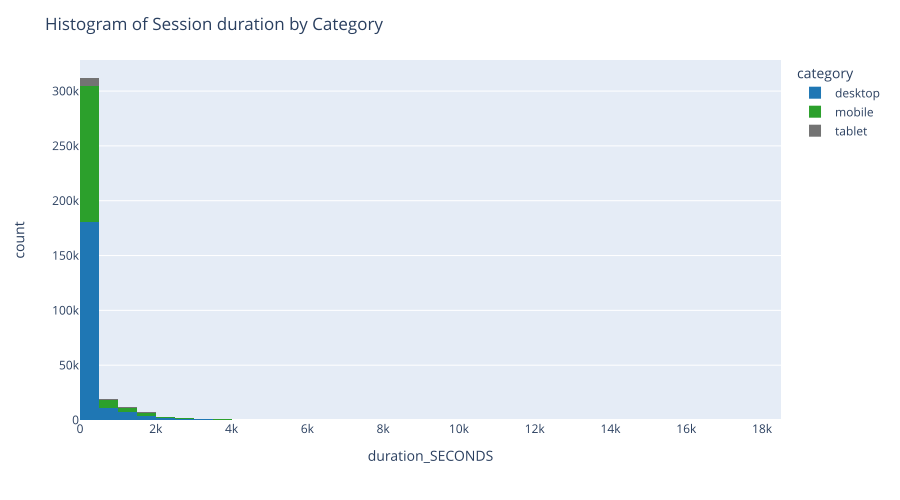

In [55]:
# Define color mapping for each category
color_mapping = {'desktop': '#1f77b4',  # Dark blue
                 'mobile': '#2ca02c',  # Turquoise green
                 'tablet': '#737373'}  # Darker grey

fig = px.histogram(df, x='duration_SECONDS', nbins= 50, color='category', color_discrete_map=color_mapping,
                   labels={'count': 'Count of sessions', 'session_duration': 'Session duration in seconds'})

fig.update_layout(title='Histogram of Session duration by Category', height=500, width=900)

fig.show("svg")


In [56]:
fig = px.box(df, x='category', y='duration_SECONDS', color='category', color_discrete_map=color_mapping,
             labels={'category': 'Category', 'session_duration': 'Session duration in seconds'})

fig.update_layout(title='Session duration boxplot by Category', height=500, width=900)
fig.show("svg")

Conclusions:

Right-skewed distribution: The histogram shows that the majority of data is concentrated towards the lower values, with a long tail extending towards the higher values on the right. This skewness suggests that there are relatively few high values compared to lower values.

Presence of outliers: The box plot reveals the presence of extreme upper bound outliers, which are data points that lie significantly above the upper quartile of the dataset.

Impact on central tendency: The presence of extreme upper bound outliers can heavily influence the mean, pulling it upwards and causing it to be significantly higher than the median. 

Robust measures of central tendency: Given the skewness and presence of outliers, it is better to rely on robust measures of central tendency such as the median rather than the mean. The median is less affected by extreme values and provides a better representation of the central tendency of the dataset.